#**Real-Time Retail Insights Dashboard**


---


**Created by:  SDA 1 - Group 13**
>
> Himanshi Saxena (045019)
>
> Jasleen Kaur Chadha (045023)
>
> Phalit Gupta (045040)




##**Dataset Description**


---



The **Retail Transactional** dataset represents retail transactional data, offering a comprehensive view of
* Customer demographics
* Purchase behavior
* Product details
* Transaction specifics

This dataset serves as a valuable resource for understanding customer behavior and improving retail operations.  


The dataset includes details such as `customer ID`, `name`, `email`, `phone`, `address`, `city`, `state`, `zipcode`, `country`, `age`, and `gender`.

Customers are `segmented` into three categories: *Premium*, *Regular*, and *New*. These details enable a better understanding of customer demographics and segmentation.

It captures transaction-specific information, including `transaction ID`, last purchase `date`, `total purchases`, `amount` spent, `feedback`, `shipping method`, `payment method`, and `order status`. This facilitates the analysis of customer behavior, satisfaction, and transaction patterns.  



> ***NOTE:*** *The dataset contains some null values and duplicate entries, which have been handled during the preprocessing stage.*

In [ ]:
# @title
import pandas as pd

# Load the dataset
df = pd.read_csv('retail.csv')

# Display the first few rows of the dataset to understand its structure
df

,Transaction_ID,Customer_ID,Name,Email,Phone,Address,City,State,Zipcode,Country,...,Total_Amount,Product_Category,Product_Brand,Product_Type,Feedback,Shipping_Method,Payment_Method,Order_Status,Ratings,products
0,8691788,37249,Michelle_Harrington,Ebony39@gmail.com,1414786801,3959_Amanda_Burgs,Dortmund,Berlin,77985,Germany,...,324.086270,Clothing,Nike,Shorts,Excellent,Same-Day,Debit_Card,Shipped,5,Cycling_shorts
1,2174773,69749,Kelsey_Hill,Mark36@gmail.com,6852899987,82072_Dawn_Centers,Nottingham,England,99071,UK,...,806.707815,Electronics,Samsung,Tablet,Excellent,Standard,Credit_Card,Processing,4,Lenovo_Tab
2,6679610,30192,Scott_Jensen,Shane85@gmail.com,8362160449,4133_Young_Canyon,Geelong,New_South_Wales,75929,Australia,...,1063.432799,Books,Penguin_Books,Children's,Average,Same-Day,Credit_Card,Processing,2,Sports_equipment
3,7232460,62101,Joseph_Miller,Mary34@gmail.com,2776751724,8148_Thomas_Creek_Suite_100,Edmonton,Ontario,88420,Canada,...,2466.854021,Home_Decor,Home_Depot,Tools,Excellent,Standard,PayPal,Processing,4,Utility_knife
4,4983775,27901,Debra_Coleman,Charles30@gmail.com,9098267635,5813_Lori_Ports_Suite_269,Bristol,England,48704,UK,...,248.553049,Grocery,Nestle,Chocolate,Bad,Standard,Cash,Shipped,1,Chocolate_cookies
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
293906,4246475,12104,Meagan_Ellis,Courtney60@gmail.com,7466353743,389_Todd_Path_Apt._159,Townsville,New_South_Wales,4567,Australia,...,973.962984,Books,Penguin_Books,Fiction,Bad,Same-Day,Cash,Processing,1,Historical_fiction
293907,1197603,69772,Mathew_Beck,Jennifer71@gmail.com,5754304957,52809_Mark_Forges,Hanover,Berlin,16852,Germany,...,285.137301,Electronics,Apple,Laptop,Excellent,Same-Day,Cash,Processing,5,LG_Gram
293908,7743242,28449,Daniel_Lee,Christopher100@gmail.com,9382530370,407_Aaron_Crossing_Suite_495,Brighton,England,88038,UK,...,182.105285,Clothing,Adidas,Jacket,Average,Express,Cash,Shipped,2,Parka
293909,9301950,45477,Patrick_Wilson,Rebecca65@gmail.com,9373222023,3204_Baird_Port,Halifax,Ontario,67608,Canada,...,120.834784,Home_Decor,IKEA,Furniture,Good,Standard,Cash,Shipped,4,TV_stand


In [ ]:
# @title
df.dtypes

Transaction_ID        int64
Customer_ID           int64
Name                 object
Email                object
Phone                 int64
Address              object
City                 object
State                object
Zipcode               int64
Country              object
Age                   int64
Gender               object
Income               object
Customer_Segment     object
Date                 object
Year                  int64
Month                object
Time                 object
Total_Purchases       int64
Amount              float64
Total_Amount        float64
Product_Category     object
Product_Brand        object
Product_Type         object
Feedback             object
Shipping_Method      object
Payment_Method       object
Order_Status         object
Ratings               int64
products             object
dtype: object

## **Tags & Fields**


---


The following are the Tag keys:
* `City`
* `State`
* `Country`
* `Gender`
* `Income`
* `Customer_Segment`
* `Month`
* `Product_Category`
* `Product_Brand`
* `Product_Type`
* `Feedback`
* `Shipping_Method`
* `Payment_Method`
* `Order_Status`
* `Ratings`



The following are the Field keys:
* `Transaction_ID`
* `Customer_ID`
* `Zipcode`
* `Total_Purchases`
* `Amount`
* `Total_Amount`
* `Age`

##**Objectives**


---




1. Track overall business performance by monitoring key metrics like total purchases, revenue, and active customers in real-time to assess business health.

2. Identify sales trend to analyze time-based sales data to understand seasonal or daily purchase patterns and adjust strategies accordingly.

3. Improve order fulfillment efficiency by tracking pending orders to identify bottlenecks in the supply chain and optimize fulfillment processes.

4. Optimize inventory management by identifying top-performing and underperforming products to ensure stock availability and avoid overstocking.

5. Boost revenue generation to focus marketing efforts on high-revenue product categories and shipping methods to maximize returns.

6. Improve marketing campaign effectivenes by aligning promotional efforts with sales trends and peak customer engagement times for better ROI.

7. Identify opportunities for product development by using product-wise and category-wise revenue data to prioritize investment in new or existing product lines.

8. Evaluate Logistics and Delivery Strategies by assesing the popularity and effectiveness of various shipping methods to optimize logistics operations and meet customer expectations.

## **Queries for building Charts**


---

#### **1. Total Purchases**  

 Displays the cumulative number of purchases, currently at 2.39K. This number reflects the overall activity and demand for products in real time.

```sql
SELECT COUNT("Total_Purchases") FROM data WHERE time > now() - 4h;
```






#### **2. Pending Orders**  

Highlights the count of unresolved or pending orders, currently at 617. This suggests potential delays in order fulfillment.  

```sql
SELECT COUNT("Transaction_ID") AS pending_orders FROM data WHERE time >= now() - 4h AND "Order_Status" = 'Pending';
```

#### **3. Shipping Method Popularity for Fulfilled Orders**  

Visualizes the proportion of orders fulfilled using different shipping methods. "Express Shipping" leads with 213 orders, followed by other methods.  

```sql
SELECT COUNT("Transaction_ID") FROM data WHERE time >= now() - 4h AND "Order_Status" = 'Delivered' GROUP BY "Shipping_Method";
```



#### **4. Sales Trend Over Time**  
Displays the fluctuation in sales volume over time, showing peaks and troughs that indicate high and low customer activity periods.  

```sql
SELECT SUM("Total_Amount") FROM data GROUP BY time(1m);
```


#### **5. Product-Wise Sales Count**  

Categorizes sales volume for different products over the last hour, highlighting bestsellers and underperformers.  

```sql
SELECT COUNT("Transaction_ID") AS sales_count FROM data WHERE time > now() - 1h GROUP BY "Product_Type";
```


#### **6. Revenue by Product Type**  

Visualizes revenue contribution from various product categories. The heatmap highlights top contributors like Smartphones and Furniture while indicating low revenue from categories like Literature and Water.  

```sql
SELECT SUM("Total_Amount") AS revenue FROM data WHERE time > now() - 1h GROUP BY "Product_Type";
```


#### **7. Customer Feedback**  

Divides feedback into *Bad*, *Average*, *Good*, and *Excellent* ratings. All categories have comparable numbers, indicating a mixed perception of service quality.  

```sql
SELECT COUNT("Customer_ID") AS feedback_count FROM data WHERE time >= now() - 10h GROUP BY "Feedback";
```


#### **8. Category-Wise Revenue**  

Highlights revenue contribution from major categories like Books, Grocery, and Home Décor. Books and Grocery dominate with revenue exceeding 665K each.  

```sql
SELECT SUM("Total_Amount") AS revenue FROM data WHERE time >= now() - 4h GROUP BY "Product_Category";
```


#### **9. Active Customers Over Time**  

Tracks the number of active customers over time, showing periods of increased engagement followed by gradual decline.  

```sql
SELECT COUNT("Transaction_ID") AS transaction_count FROM data WHERE time > now() - 4h GROUP BY time(5m), "Customer_ID";
```
  

#### **10. Payment Method Distribution**  

The pie chart highlights the distribution of payment methods among customers: Credit Card (26%), the most preferred payment method, slightly ahead of others and PayPal (25%), Debit Card (25%), and Cash (24%), qually significant usage, indicating a balanced reliance on digital and traditional payment methods.  

```sql
SELECT COUNT("Transaction_ID") AS payment_count FROM data WHERE time >= now() - 5h GROUP BY "Payment_Method";
```

#### **11. Gender-Based Spending Patterns**  

The stacked bar chart showcases spending trends by gender over time. Males consistently outspend females across all time slots, peaking at **19:20 and 19:30**.  

```sql
SELECT SUM("Total_Amount") AS total_spent FROM data WHERE time >= now() - 4h GROUP BY time(5m), "Gender";
```


#### **12. Average Age Groups for Brands**  

The horizontal bar chart represents average customer age by brand. Brands like Adidas (23.6 years) and Nike (23.4 years) attract younger demographics. Bed Bath & Beyond (29.0 years) and Harper Collins (28.5 years) have an older customer base.  

```sql
SELECT MEAN("Age") AS avg_age FROM data WHERE time >= now() - 4h GROUP BY "Product_Brand";
```  


#### **13. Transaction Density Analysis**
  
The heatmap visualizes transaction density across product types and time. High-density clusters are observed for products like Tools, T-shirts, and Snacks between 19:15–19:30. Products such as Children's Items and Furniture show lower transaction density.

```sql
SELECT COUNT("Transaction_ID") AS transaction_count FROM data WHERE time >= now() - 1h GROUP BY time(10m), "Product_Type";
```

## **Dashboard**


---



The dashboard is created on Grafana with a Kaggle dataset streamed via InfluxDB.

In [ ]:
# @title
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# @title
# prompt: insert a video in my google drive to google colab

import pandas as pd
from google.colab import drive

# Mount Google Drive
#

# Assuming your video is in a folder named 'videos' in your Google Drive's 'My Drive'
# Replace 'path/to/your/video.mp4' with the actual path to your video file in Google Drive
video_path = '/content/drive/MyDrive/Grafana Dashboard.mp4'

# Now you can use the video_path variable to access your video in Colab
# For example, to display the video using IPython.display:
from IPython.display import HTML
from base64 import b64encode

mp4 = open(video_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width="960" height="540" controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

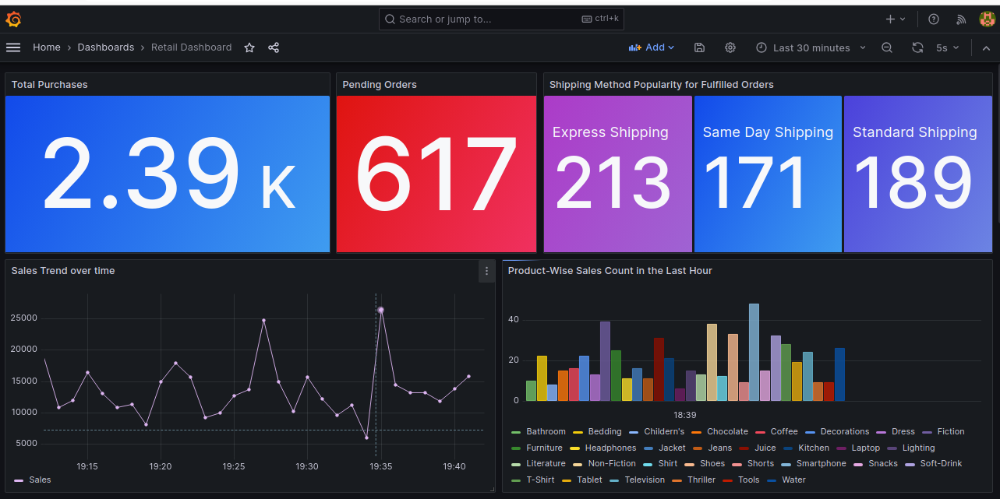

In [ ]:
# @title
from IPython.display import Image, display

# Display the screenshot
display(Image(filename='g1.png'))

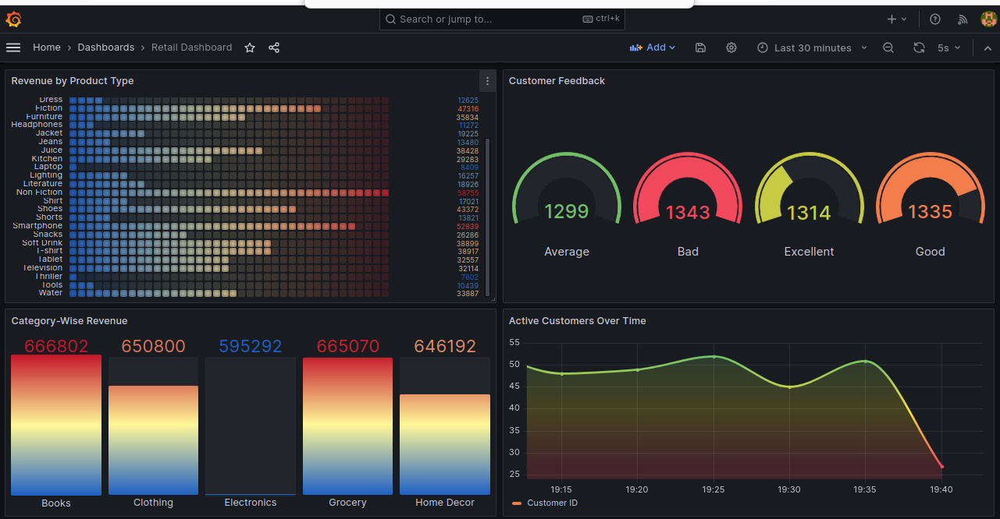

In [ ]:
# @title
from IPython.display import Image, display

# Display the screenshot
display(Image(filename='g2.png'))

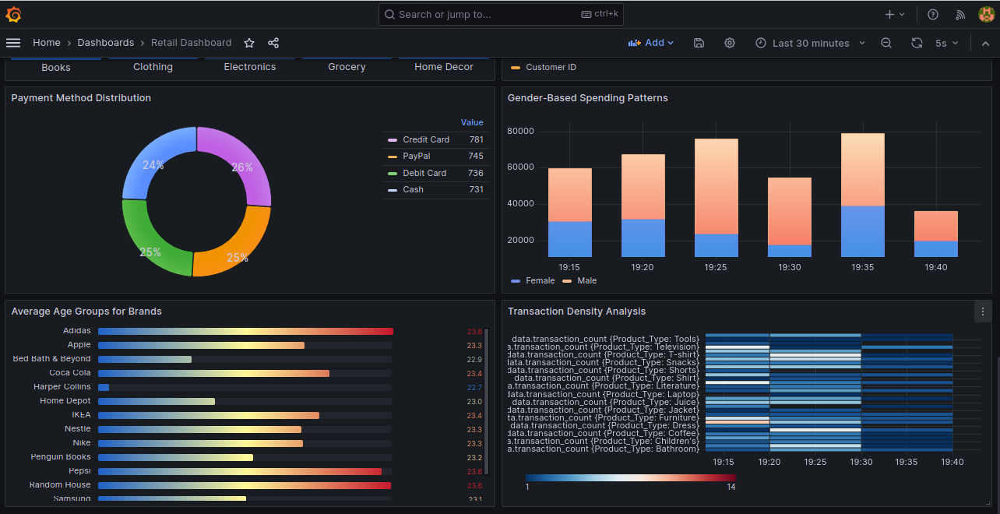

In [ ]:
# @title
from IPython.display import Image, display

# Display the screenshot
display(Image(filename='g3.png'))

## **Managerial Insights**


---



Key Managerial Insights for Optimizing Sales, Customer Engagement, and Operational Efficiency:

1. **Monitor Purchase Volume Trends:** Track total purchases to identify seasonal fluctuations or promotional impacts. Align marketing and inventory strategies to maintain a balance between demand and supply chain capacity.


2. **Address Pending Orders Promptly:** Minimize pending orders by identifying and resolving bottlenecks in the order fulfillment process, improving efficiency and customer satisfaction, which can positively impact overall sales and reputation.


3. **Optimize Shipping Methods:** Leverage the popularity of Express Shipping by maintaining competitive delivery times and exploring promotional offers to increase the uptake of underutilized shipping methods, such as Same Day delivery.


4. **Maximize Sales During Peak Times:** Align marketing campaigns and promotional offers with peak sales periods to maximize customer engagement, while addressing low sales periods with targeted offers to boost activity.


5. **Focus on High-Performing Products:** Ensure sufficient stock levels for bestselling products to avoid stockouts and use insights from sales volume to develop targeted marketing campaigns for low-performing products.


6. **Enhance Revenue from High-Performing Categories:** Increase visibility and focus marketing efforts on high-revenue categories like Smartphones and Furniture while re-evaluating underperforming categories to boost overall revenue contribution.

7. **Act on Customer Feedback:** Prioritize addressing negative feedback to prevent churn and capitalize on positive feedback to replicate successful customer experiences across the business. Continuously monitor feedback for improvements.


8. **Prioritize Inventory for High-Revenue Categories:** Allocate resources and focus marketing strategies on high-revenue categories, such as Books and Grocery, while exploring strategies to improve underperforming categories like Electronics and Home Décor.


9. **Leverage Active Customer Engagement:** Use peak customer engagement times to schedule promotions and loyalty campaigns, while addressing periods of declining engagement through retargeting strategies to increase repeat business.


10. **Balance Payment Method Support:** Support a balanced range of payment methods to cater to diverse customer preferences, while targeting credit card promotions to improve transaction security and processing efficiency.

##**Conclusion**


---


The dashboard analysis provides actionable insights to enhance business performance. High total purchases and active engagement during peak times indicate strong product demand, suggesting opportunities for targeted marketing campaigns.

Product-wise sales and shipping method preferences inform inventory planning and logistics strategies. Optimizing high-revenue categories, addressing low-performing categories, and resolving negative feedback are essential for improving customer satisfaction and loyalty.

A tailored approach to customer engagement, including gender-specific campaigns and leveraging peak transaction times, can further boost sales. By combining these strategies with data-driven decision-making, businesses can effectively navigate market dynamics and achieve sustainable growth.
